<a href="https://colab.research.google.com/github/RizkyFirdiansyah/PCVK_Ganjil2026/blob/main/Week03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Mengubah tingkat kecerahan citra
--------------------------------


/tmp/ipykernel_732/2663673116.py:20: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


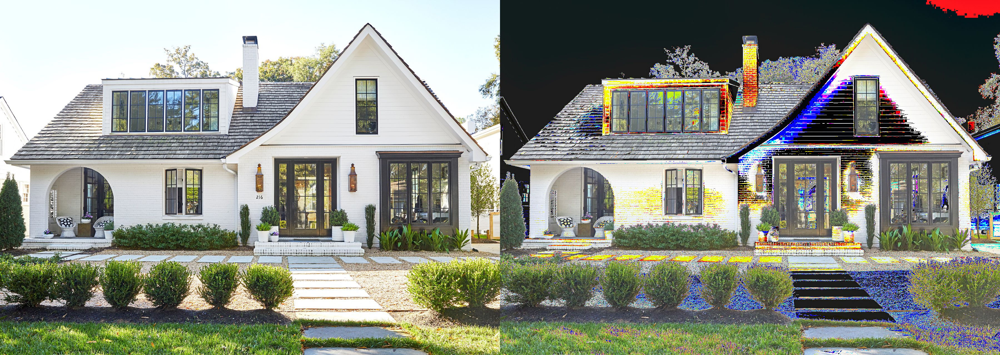

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Transformasi linier brightness
print('Mengubah tingkat kecerahan citra')
print('--------------------------------')

try:
  brightness = int(input('Masukan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv2.imread('/content/drive/MyDrive/PCVK2026/house.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

final_frame = cv2.hconcat((original, brightness_image))
cv2_imshow(final_frame)

INVERSE CITRA


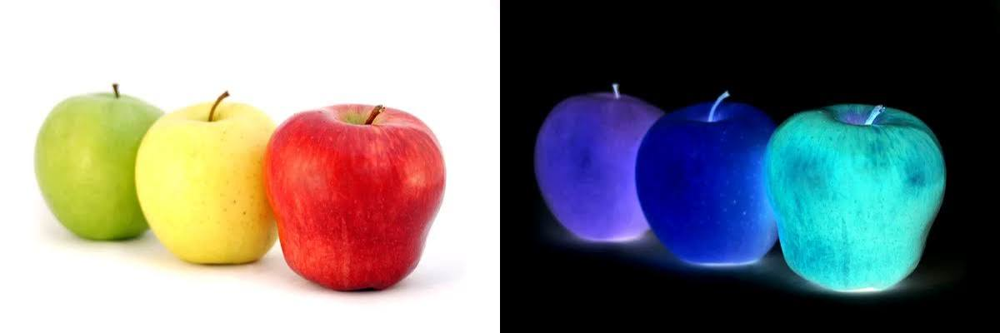

In [ ]:
# Inverse Citra
img_original = cv2.imread('/content/drive/MyDrive/PCVK2026/buah.jpg')

# Operasi Inverse Citra
img_inverse = 255 - img_original

# Hasil
final_frame = cv2.hconcat((img_original, img_inverse))
print("INVERSE CITRA")
cv2_imshow(final_frame)

Mengubah kontras dan tingkat kecerahan citra
--------------------------------
Masukan nilai kontras: 10
Masukan nilai kecerahan: 1.5
CONTRAST & BRIGHTNESS


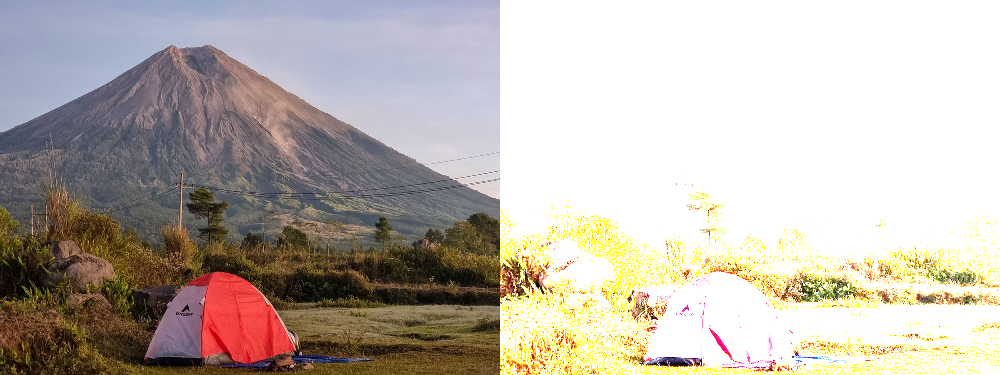

In [ ]:
# Transformasi Contrast & Brightness

print('Mengubah kontras dan tingkat kecerahan citra')
print('--------------------------------')

try:
  contrast = float(input('Masukan nilai kontras: '))
  brightness = float(input('Masukan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

img_original = cv2.imread('/content/drive/MyDrive/PCVK2026/gunung.jpeg')
img_contrast = np.clip(contrast * img_original.astype(np.float32) + brightness, 0, 255).astype(np.uint8)

final_frame = cv2.hconcat((img_original, img_contrast))
print("CONTRAST & BRIGHTNESS")
cv2_imshow(final_frame)


Mengubah tingkat kecerahan citra dengan Transformasi Log
---------------------------------------------------------
Masukan nilai kecerahan/konstanta c: 50
LOGARITHMIC BRIGHTNESS


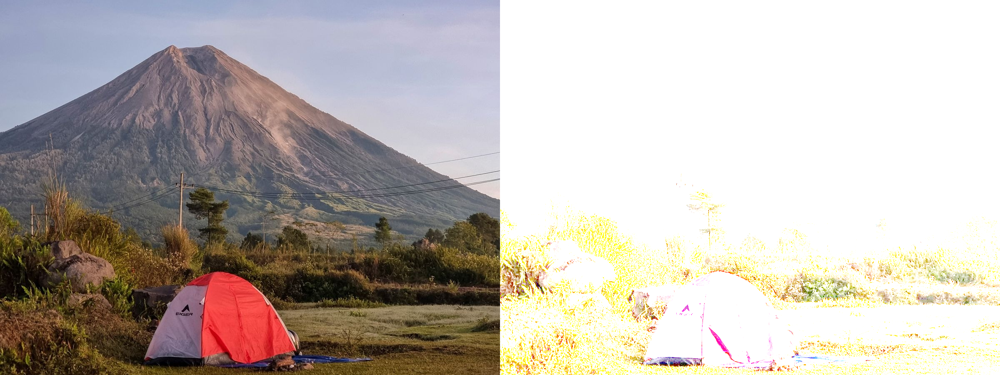

In [ ]:
# Transformasi Logarithmic Brightness
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('---------------------------------------------------------')

try:
  c_val = float(input('Masukan nilai kecerahan/konstanta c: '))
except ValueError:
  print('Error, not a number')

img_original = cv2.imread('/content/drive/MyDrive/PCVK2026/gunung.jpeg')
c_eff = (c_val / 30.0) * (255 / np.log(1 + 255))
img_float = img_original.astype(np.float32)
img_log = np.clip(c_eff * np.log(1.0 + img_float), 0, 255).astype(np.uint8)

final_frame = cv2.hconcat((img_original, img_log))
print("LOGARITHMIC BRIGHTNESS")
cv2_imshow(final_frame)

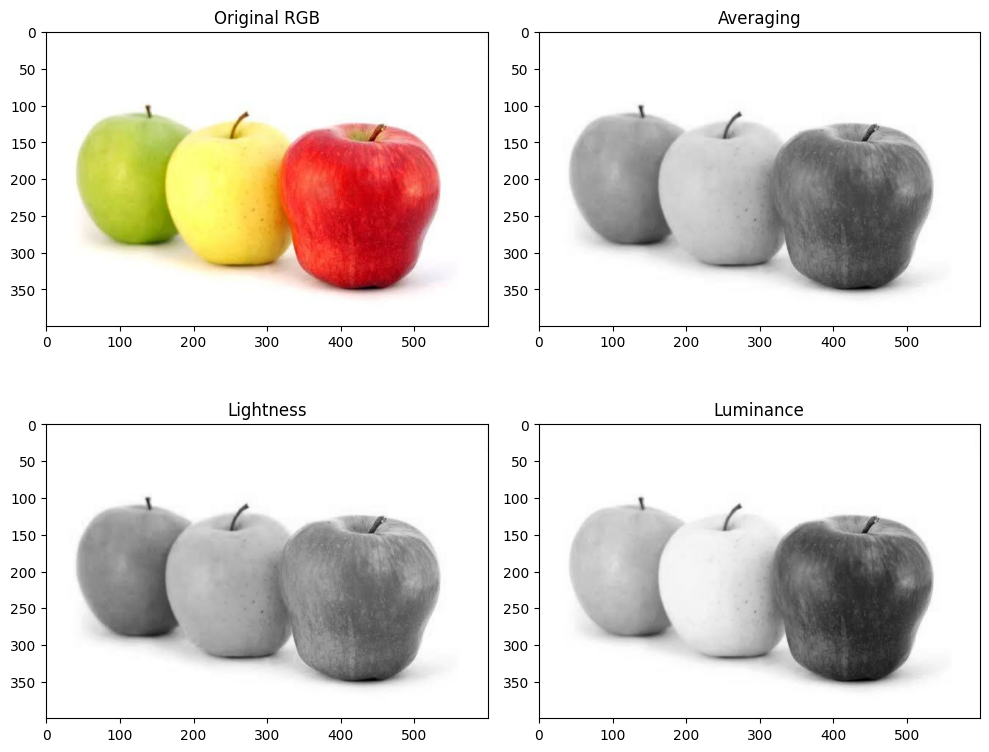

In [ ]:
# Transformasi grayscale (averaging, lightness, dan luminance)
import matplotlib.pyplot as plt
# Konversi Grayscale (Averaging, Lightness, Luminance)
img_bgr = cv2.imread('/content/drive/MyDrive/PCVK2026/buah.jpg')

# Pisahkan kanal OpenCV (BGR)
B = img_bgr[:, :, 0].astype(np.float32)
G = img_bgr[:, :, 1].astype(np.float32)
R = img_bgr[:, :, 2].astype(np.float32)

# Averaging
gray_avg = ((R + G + B) / 3.0).astype(np.uint8)

# Lightness
max_rgb = np.maximum(np.maximum(R, G), B)
min_rgb = np.minimum(np.minimum(R, G), B)
gray_lightness = ((max_rgb + min_rgb) / 2.0).astype(np.uint8)

# Luminance
gray_luminance = (0.21 * R + 0.72 * G + 0.07 * B).astype(np.uint8)

# Tampilkan dengan Matplotlib
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes[0, 0].imshow(img_rgb); axes[0, 0].set_title("Original RGB")
axes[0, 1].imshow(gray_avg, cmap='gray'); axes[0, 1].set_title("Averaging")
axes[1, 0].imshow(gray_lightness, cmap='gray'); axes[1, 0].set_title("Lightness")
axes[1, 1].imshow(gray_luminance, cmap='gray'); axes[1, 1].set_title("Luminance")
# for ax in axes.ravel(): ax.axis('off')
plt.tight_layout()
plt.show()

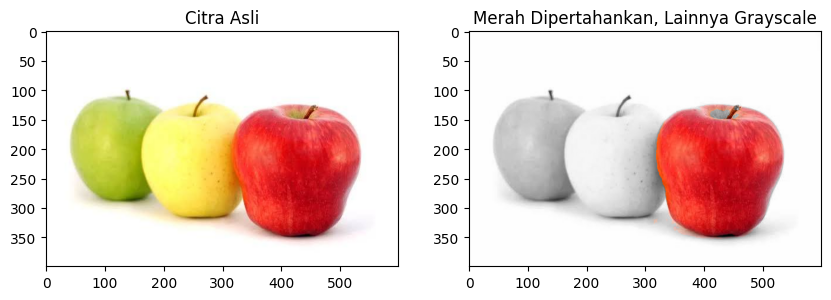

In [ ]:
# Seleksi warna
img_bgr = cv2.imread('/content/drive/MyDrive/PCVK2026/buah.jpg')

# Konversi ke HSV untuk isolasi warna merah secara presisi
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

# Masking warna merah (dua rentang hue)
mask1 = cv2.inRange(hsv, np.array([0, 50, 50]), np.array([10, 255, 255]))
mask2 = cv2.inRange(hsv, np.array([170, 50, 50]), np.array([180, 255, 255]))
mask_red = cv2.bitwise_or(mask1, mask2)

# Buat versi Grayscale Luminance 3-channel
B, G, R = img_bgr[:, :, 0], img_bgr[:, :, 1], img_bgr[:, :, 2]
gray_lum = (0.21 * R + 0.72 * G + 0.07 * B).astype(np.uint8)
gray_3ch = cv2.merge([gray_lum, gray_lum, gray_lum])

# Kombinasikan: Piksel Merah diambil dari citra asli, piksel lain dari citra Grayscale
img_selective = np.where(mask_red[:, :, None] == 255, img_bgr, gray_3ch)

# Visualisasi
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)); ax[0].set_title("Citra Asli")
ax[1].imshow(cv2.cvtColor(img_selective, cv2.COLOR_BGR2RGB)); ax[1].set_title("Merah Dipertahankan, Lainnya Grayscale")
# for a in ax: a.axis('off')
plt.show()

<>:23: SyntaxWarning: invalid escape sequence '\g'
<>:23: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_732/2083324736.py:23: SyntaxWarning: invalid escape sequence '\g'
  ax[1].imshow(cv2.cvtColor(img_gamma, cv2.COLOR_BGR2RGB)); ax[1].set_title(f"Gamma Correction ($\gamma$ = {gamma})")


 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 0.5


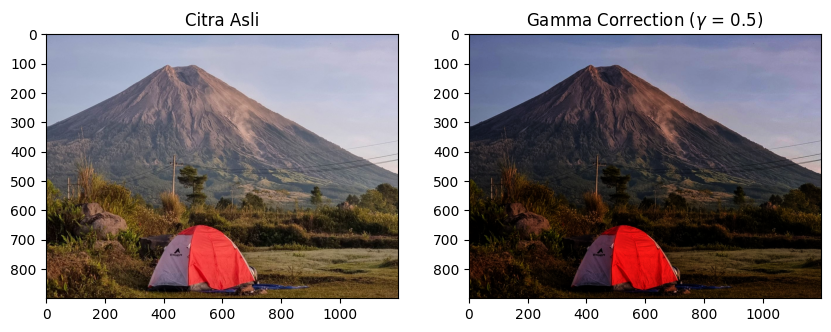

In [ ]:
# Gamma correction
import cv2
import numpy as np
import matplotlib.pyplot as plt

print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
   print('Error, not a number')

img_original = cv2.imread('/content/drive/MyDrive/PCVK2026/gunung.jpeg')

# Gamma Correction
inv_gamma = 1.0 / gamma
table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
img_gamma = cv2.LUT(img_original, table)

# Visualisasi
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)); ax[0].set_title("Citra Asli")
ax[1].imshow(cv2.cvtColor(img_gamma, cv2.COLOR_BGR2RGB)); ax[1].set_title(f"Gamma Correction ($\gamma$ = {gamma})")
# for a in ax: a.axis('off')
plt.show()

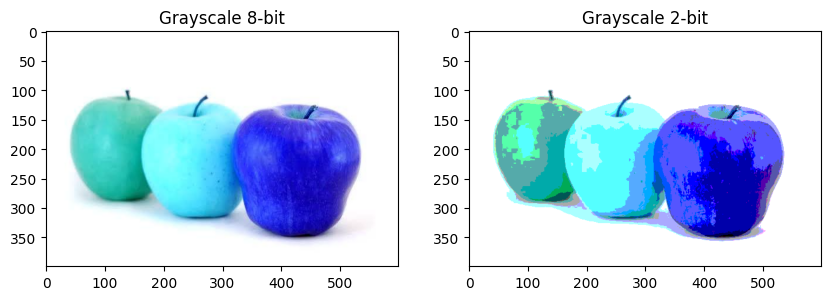

In [ ]:
# Image depth
bit_depth = 2
level = 255.0 / (pow(2, bit_depth) - 1)

original = cv2.imread('/content/drive/MyDrive/PCVK2026/buah.jpg')

# Kuantisasi warna
depth_image = (np.round(original / level) * level).astype(np.uint8)

# Visualisasi
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(original, cmap='gray'); ax[0].set_title("Grayscale 8-bit")
ax[1].imshow(depth_image, cmap='gray'); ax[1].set_title(f"Grayscale {bit_depth}-bit")
# for a in ax: a.axis('off')
plt.show()

Total citra noise terisi: 100

=== HASIL EVALUASI AVERAGE DENOISING ===

--- Average 10 Citra ---


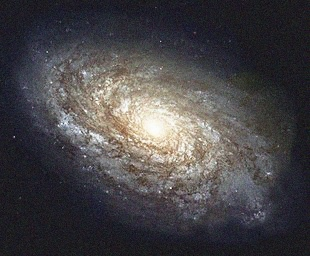

Nilai PSNR: 33.62 dB
----------------------------------------
--- Average 20 Citra ---


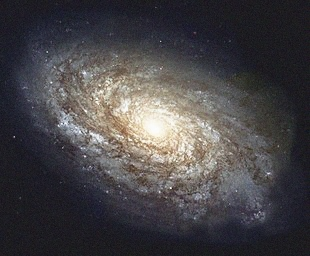

Nilai PSNR: 37.11 dB
----------------------------------------
--- Average 40 Citra ---


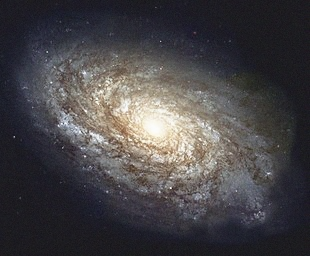

Nilai PSNR: 41.27 dB
----------------------------------------
--- Average 80 Citra ---


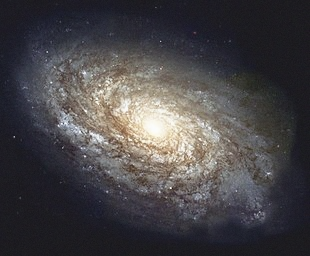

Nilai PSNR: 48.36 dB
----------------------------------------
--- Average 100 Citra ---


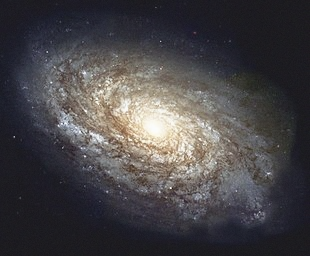

Nilai PSNR: 100.00 dB
----------------------------------------


In [8]:
import glob
import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Baca seluruh 100 citra ber-noise
cv_img = []
noise_files = sorted(glob.glob('/content/drive/MyDrive/PCVK2026/noises/*.jpg'))

for img_path in noise_files:
  n = cv2.imread(img_path)
  if n is not None:
    cv_img.append(n)

print(f'Total citra noise terisi: {len(cv_img)}')

# Buat Citra Acuan Sintetis dari Rata-rata Seluruh 100 Citra
stack_all = np.stack(cv_img, axis=0).astype(np.float64)
img_clean_synthetic = np.mean(stack_all, axis=0).astype(np.uint8)

# Fungsi PSNR
def calc_psnr(img_ref, img_target):
  mse = np.mean(
      (img_ref.astype(np.float64) - img_target.astype(np.float64)) ** 2
  )
  if mse == 0:
    return 100.0
  return 20 * np.log10(255.0 / np.sqrt(mse))

# Evaluasi Averaging & Display Gambar + PSNR
sample_counts = [10, 20, 40, 80, 100]
print('\n=== HASIL EVALUASI AVERAGE DENOISING ===\n')
for N in sample_counts:
  # Lakukan averaging sebanyak N citra
  stack_N = np.stack(cv_img[:N], axis=0).astype(np.float64)
  avg_img = np.mean(stack_N, axis=0).astype(np.uint8)

  # Hitung nilai PSNR
  psnr_val = calc_psnr(img_clean_synthetic, avg_img)

  # Tampilkan Gambar dan Informasi Nilai PSNR
  print(f'--- Average {N} Citra ---')
  cv2_imshow(avg_img)
  print(f'Nilai PSNR: {psnr_val:.2f} dB')
  print('-' * 40)